# Housing price prediction

**STATEMENT:**

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company. A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. Thedata is provided in the CSV file below. The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know: • Which variables are important to predict the price of variable? • How do these variables describe the price of the house?

In [1]:
# to import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

In [2]:
#To see all columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
# to import train dataset
df = pd.read_csv(r"C:\Users\user\OneDrive\Documents\fliprobo new intership\Project-Housing--2---1-\Project-Housing_splitted\train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [4]:
#to import test dataset
df1 = pd.read_csv(r"C:\Users\user\OneDrive\Documents\fliprobo new intership\Project-Housing--2---1-\Project-Housing_splitted\test.csv") #Reading csv file
df1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


## Exploratory Data Analysis of training dataset:

In [5]:
# to check column names
df.columns.tolist()

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF'

In [6]:
# to check basic infomation about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

There are 81 columns and 1168 rows.The dataset has int64, float and object datatypes.
There are also null values present in the dataset.

In [7]:
# to check for null values
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

Alley, PoolQC, Fence and MiscFeature has more than 80% of null values.I can drop these columns due lack of data.

In [8]:
#to Drop unnecessary columns in train dataset
df = df.drop(["Alley"],axis=1)
df = df.drop(["PoolQC"],axis=1)
df = df.drop(["Fence"],axis=1)
df = df.drop(["MiscFeature"],axis=1)

In [9]:
# to check for data shape after dropping columns
df.shape

(1168, 77)

In [10]:
#to Check unique values of each column in train dataset
df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFinSF       21
GrLivArea 

* Id column has all unique values as Id is unique identity number given to each asset.It doesn't contribute in model training so i can drop this column.
* Utilities column has only 1 unique value,which means all the entries are same. This will not help us in model building so let's drop this column.

In [11]:
# to Drop unnecessary columns in train dataset
df = df.drop(["Id"],axis=1)
df = df.drop(["Utilities"],axis=1)

In [12]:
# to check for data shape after dropping columns
df.shape

(1168, 75)

In [13]:
#to check the value count of each column to varify if any unexpected and unwanted entries are present in the columns of train dataset.
for i in df.columns:
        print(df[i].value_counts())
        print('-------------------------------------')

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
-------------------------------------
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
-------------------------------------
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
24.0      16
68.0      16
79.0      14
21.0      14
64.0      14
72.0      13
51.0      13
55.0      13
100.0     12
82.0      12
59.0      12
63.0      11
74.0      11
71.0      11
53.0      10
66.0      10
69.0      10
88.0      10
34.0       9
67.0       9
84.0       9
52.0       8
40.0       8
43.0       8
76.0       8
92.0       8
77.0       8
62.0       7
57.0       7
61.0       7
86.0       7
35.0       7
95.0       7
44.0       6
81.0       6
94.0       6
41.0       6
54.0       6


In the dataset we can observe more than 85% zero values are present in some columns-
* BsmtFinSF2 has 1032 zero values.
* LowQualFinSF has 1145 zero values.
* EnclosedPorch has 999 zero values.
* 3SsnPorch has 1146 zero values.
* ScreenPorch has 1073 zero values.
* PoolArea has 1161 zero values.
* MiscVal has 1126 zero values.

I will not drop columns with below 60% 0f  zero values, instead they will be replaced with mean or mode.However, I will drop all the columns with more than 85% of zero values as they will not contribute in model building.

In [14]:
#Dropping unnecessary columns in train dataset
df.drop(columns = ['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],inplace = True)

In [15]:
# to check for data shape after dropping columns
df.shape

(1168, 68)

In [16]:
df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinSF1         0
BsmtFinType2      31
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr 

In [17]:
# to check for numerical columns
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice']


In [18]:
# to Replace null values of numerical column with mean of that column in train dataset.
for i in range(0,len(numerical_columns)):
    if df[numerical_columns[i]].dtype != "object":
        df[numerical_columns[i]].fillna(df[numerical_columns[i]].mean(), inplace=True)

In [19]:
# to check for categorical columns
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [20]:
# to Replace null values of categorical column with mode of that column in train dataset.
for i in range(0,len(categorical_columns)):
    if df[categorical_columns[i]].dtype == "object":
        df[categorical_columns[i]].fillna(df[categorical_columns[i]].mode()[0], inplace=True)

In [21]:
df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu 

## Exploratory Data Analysis of testing dataset:

In [22]:
# to check column names
df1.columns.tolist()

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF'

In [23]:
#to get basic information about testing dataset
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

There are 80 columns and 292 rows.The dataset has int64, float and object datatypes. There are also null values present in the dataset.

In [24]:
#to check for null values
df1.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

Alley, PoolQC, Fence and MiscFeature has more than 80% of null values.I can drop these columns due lack of data.

In [25]:
#to Drop unnecessary columns in train dataset
df1 = df1.drop(["Alley"],axis=1)
df1 = df1.drop(["PoolQC"],axis=1)
df1 = df1.drop(["Fence"],axis=1)
df1 = df1.drop(["MiscFeature"],axis=1)

In [26]:
# to check for data shape after dropping columns
df1.shape

(292, 76)

In [27]:
#to Check unique values of each column in train dataset
df1.nunique()

Id               292
MSSubClass        15
MSZoning           4
LotFrontage       65
LotArea          249
Street             2
LotShape           4
LandContour        4
Utilities          2
LotConfig          5
LandSlope          3
Neighborhood      24
Condition1         8
Condition2         2
BldgType           5
HouseStyle         8
OverallQual        8
OverallCond        7
YearBuilt         84
YearRemodAdd      57
RoofStyle          5
RoofMatl           3
Exterior1st       12
Exterior2nd       14
MasVnrType         4
MasVnrArea       104
ExterQual          4
ExterCond          4
Foundation         6
BsmtQual           4
BsmtCond           3
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       184
BsmtFinType2       6
BsmtFinSF2        32
BsmtUnfSF        231
TotalBsmtSF      224
Heating            4
HeatingQC          4
CentralAir         2
Electrical         4
1stFlrSF         238
2ndFlrSF         113
LowQualFinSF       4
GrLivArea        246
BsmtFullBath       3
BsmtHalfBath 

* Id column has all unique values as Id is unique identity number given to each asset.It doesn't contribute in model training so i can drop this column.
* Although Utilities column has only 2 unique value,but i will drop the column as i had already dropped the same column in trainning dataset.

In [28]:
# to Drop unnecessary columns in train dataset
df1 = df1.drop(["Id"],axis=1)
df1 = df1.drop(["Utilities"],axis=1)

In [29]:
df1.shape

(292, 74)

In [30]:
#to check the value count of each column to varify if any unexpected and unwanted entries are present in the columns of train dataset.
for i in df1.columns:
        print(df1[i].value_counts())
        print('-------------------------------------')

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
190      4
180      4
75       2
45       2
85       1
40       1
Name: MSSubClass, dtype: int64
-------------------------------------
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
-------------------------------------
60.0     32
85.0     14
50.0     13
70.0     12
80.0      9
21.0      9
65.0      9
75.0      7
52.0      6
78.0      6
63.0      6
66.0      5
64.0      5
57.0      5
74.0      4
55.0      4
43.0      4
40.0      4
72.0      4
100.0     4
67.0      3
76.0      3
24.0      3
79.0      3
90.0      3
44.0      3
110.0     3
68.0      3
86.0      3
102.0     3
93.0      3
48.0      3
96.0      2
35.0      2
107.0     2
32.0      2
42.0      2
37.0      2
62.0      2
51.0      2
56.0      2
58.0      2
92.0      2
47.0      2
73.0      2
83.0      2
91.0      2
98.0      2
120.0     1
45.0      1
33.0      1
137.0     1
150.0     1
59.

In the dataset we can observe more than 85% zero values are present in some columns-
* BsmtFinSF2 
* LowQualFinSF 
* EnclosedPorch 
* 3SsnPorch 
* ScreenPorch 
* PoolArea 
* MiscVal 
I will not drop columns with below 60% 0f zero values, instead they will be replaced with mean or mode.However, I will drop all the columns with more than 85% of zero values as they will not contribute in model building.

In [31]:
# to Drop unnecessary columns in test dataset
df1.drop(columns = ['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],inplace = True)

In [32]:
# to check for data shape after dropping columns
df1.shape

(292, 67)

In [33]:
#to check null values
df1.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr 

In [34]:
# to check for numerical columns
numerical_columns=[]
for i in df1.dtypes.index:
    if df1.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold']


In [35]:
# to Replace null values of numerical column with mean of that column in train dataset.
for i in range(0,len(numerical_columns)):
    if df1[numerical_columns[i]].dtype != "object":
        df1[numerical_columns[i]].fillna(df1[numerical_columns[i]].mean(), inplace=True)

In [36]:
# to check for categorical columns
categorical_columns=[]
for i in df1.dtypes.index:
    if df1.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [37]:
# to Replace null values of categorical column with mode of that column in train dataset.
for i in range(0,len(categorical_columns)):
    if df1[categorical_columns[i]].dtype == "object":
        df1[categorical_columns[i]].fillna(df1[categorical_columns[i]].mode()[0], inplace=True)

In [38]:
# to check null values after replacing them with mean and mode
df1.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu 

## Feature Extraction of Training Dataset:

In [39]:
# Converting years column to age column in train dataset
df['Year_SinceBuilt'] = df['YearBuilt'].max() - df['YearBuilt']
df['Year_SinceRemodAdded'] = df['YearRemodAdd'].max() - df['YearRemodAdd']
df['Year_SinceSold'] = df['YrSold'].max() - df['YrSold']
df['GarageAge'] = df['GarageYrBlt'].max() - df['GarageYrBlt']

In [40]:
# to Drop old columns in train dataset
df.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

In [41]:
df.shape

(1168, 68)

In [42]:
df.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,3,33.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,3,40.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,3,13.0


In [43]:
# to get stastical information about dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1168.0,56.767979,41.940650,20.0,20.00,50.000000,70.00,190.0
LotFrontage,1168.0,70.988470,22.437056,21.0,60.00,70.988470,79.25,313.0
LotArea,1168.0,10484.749144,8957.442311,1300.0,7621.50,9522.500000,11515.50,164660.0
OverallQual,1168.0,6.104452,1.390153,1.0,5.00,6.000000,7.00,10.0
OverallCond,1168.0,5.595890,1.124343,1.0,5.00,5.000000,6.00,9.0
MasVnrArea,1168.0,102.310078,182.047152,0.0,0.00,0.000000,160.00,1600.0
BsmtFinSF1,1168.0,444.726027,462.664785,0.0,0.00,385.500000,714.50,5644.0
BsmtUnfSF,1168.0,569.721747,449.375525,0.0,216.00,474.000000,816.00,2336.0
TotalBsmtSF,1168.0,1061.095034,442.272249,0.0,799.00,1005.500000,1291.50,6110.0
1stFlrSF,1168.0,1169.860445,391.161983,334.0,892.00,1096.500000,1392.00,4692.0


## Feature Extraction of Testing Dataset:

In [44]:
# Converting years column to age column in test dataset
df1['Year_SinceBuilt'] = df1['YearBuilt'].max() - df1['YearBuilt']
df1['Year_SinceRemodAdded'] = df1['YearRemodAdd'].max() - df1['YearRemodAdd']
df1['Year_SinceSold'] = df1['YrSold'].max() - df1['YrSold']
df1['GarageAge'] = df1['GarageYrBlt'].max() - df1['GarageYrBlt']

In [45]:
# to Drop old columns in test dataset
df1.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

In [46]:
df1.shape

(292, 67)

In [47]:
df1.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,20,RL,86.000000,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,WD,Normal,4,4,3,5.0
1,120,RL,66.425101,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,COD,Abnorml,25,26,1,26.0
2,20,RL,66.425101,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,1753,1753,GasA,Ex,Y,SBrkr,1788,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,6,WD,Normal,8,9,1,9.0


 Converted all the year columns to their respective age, considering age will more insight than year in both train and test datasets.

In [48]:
# to get stastical information about dataset
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,292.0,57.414384,43.780649,20.0,20.00,50.000000,70.00,190.0
LotFrontage,292.0,66.425101,19.975962,21.0,57.75,66.425101,76.00,150.0
LotArea,292.0,10645.143836,13330.669795,1526.0,7200.00,9200.000000,11658.75,215245.0
OverallQual,292.0,6.078767,1.356147,3.0,5.00,6.000000,7.00,10.0
OverallCond,292.0,5.493151,1.063267,3.0,5.00,5.000000,6.00,9.0
MasVnrArea,292.0,109.171821,174.729023,0.0,0.00,0.000000,180.00,1031.0
BsmtFinSF1,292.0,439.294521,429.559675,0.0,0.00,369.500000,700.50,1767.0
BsmtUnfSF,292.0,557.315068,411.043768,0.0,255.00,487.000000,780.00,1935.0
TotalBsmtSF,292.0,1042.767123,424.561153,0.0,771.75,971.000000,1322.00,3094.0
1stFlrSF,292.0,1133.691781,366.941919,372.0,858.00,1047.500000,1370.50,2402.0


## Visualization:

In [49]:
# Separating categorical columns
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [50]:
# Separating numerical columns
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'SalePrice', 'Year_SinceBuilt', 'Year_SinceRemodAdded', 'Year_SinceSold', 'GarageAge']


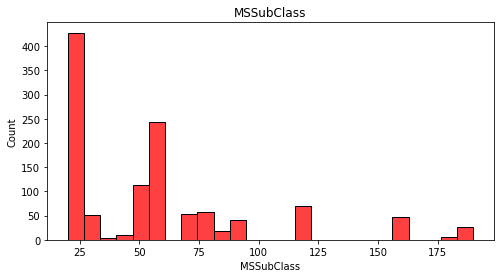

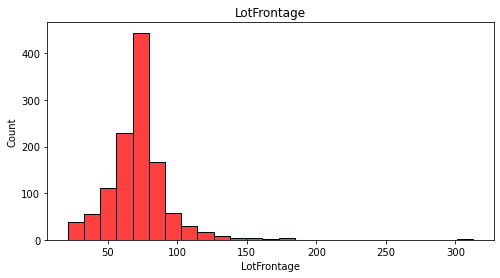

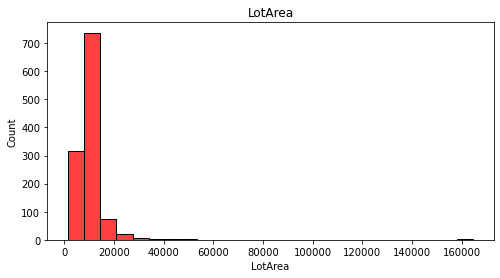

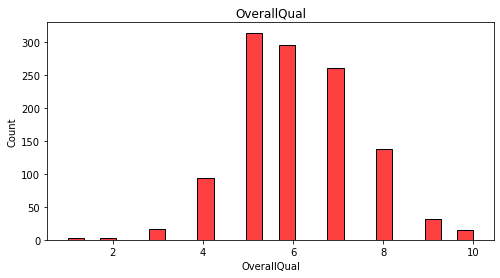

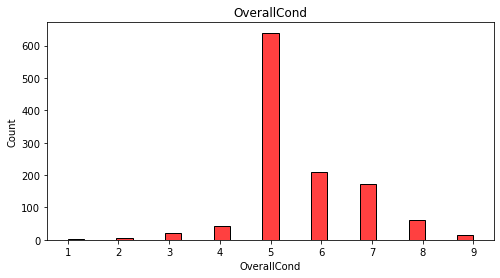

...

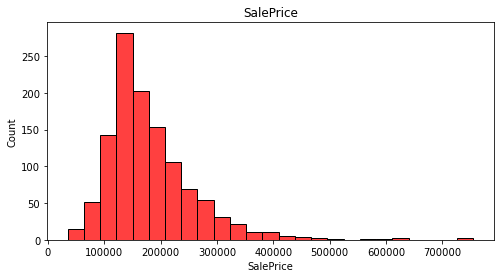

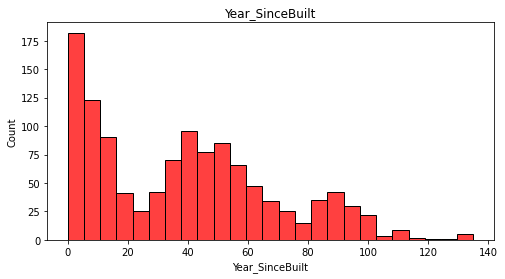

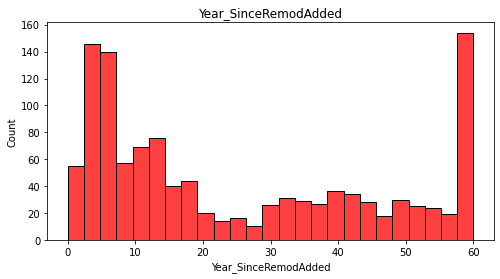

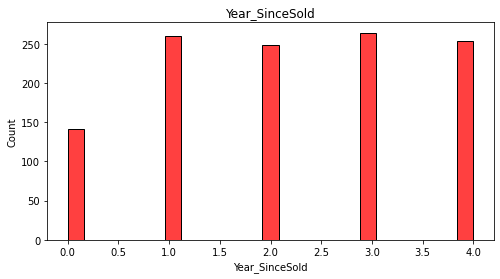

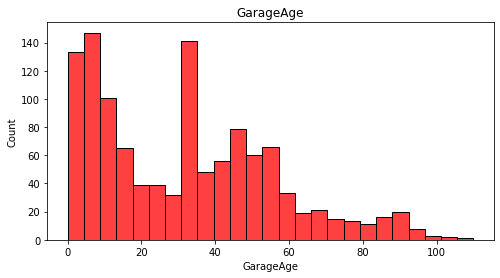

In [196]:
#Distribution plot for all numerical columns
for i in df[numerical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.histplot(df[i], bins = 25, color="r")
    plt.title(i)
    plt.show()

Observations:
1.	As Linear feet of street connected to property(LotFrontage) is increasing sales is decreasing and the SalePrice is ranging between 0-3 lakhs.
2.	As Lot size in square feet(LotArea) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
3.	As Masonry veneer area in square feet (MasVnrArea) is increasing sales is decreasing and SalePrice is ranging between 0-4 lakhs.
4.	As Type 1 finished square feet(BsmtFinSF1) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
5.	As Unfinished square feet of basement area (BsmtUnfSF) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs. There are some outliers also.
6.	As Total square feet of basement area (TotalBsmtSF) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
7.	As First Floor square feet(1stFlrSF) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
8.	As Second floor square feet(2ndFlrSF) is increasing sales is increasing in the range 500-1000 and the SalePrice is in between 0-4 lakhs.
9.	As Above grade (ground) living area square feet (GrLivArea) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
10.	As Size of garage in square feet(GarageArea) is increasing sales is increasing and the SalePrice is in between 0-4 lakhs.
11.	As Wood deck area in square feet(WoodDeckSF) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
12.	As Open porch area in square feet (OpenPorchSF) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.
13.	As Year_SinceBuilt is increasing sales is decreasing and the SalePrice is high for newly built building and the sales price is in between 0-4 lakhs.
14.	As Since Remodel date (same as construction date if no remodeling or additions)(Year_SinceRemodAdded) is increasing sales is decreasing and the SalePrice is in between 1-4 lakhs.
15.	As Since Year garage was built(GarageAge) is increasing sales is decreasing and the SalePrice is in between 0-4 lakhs.


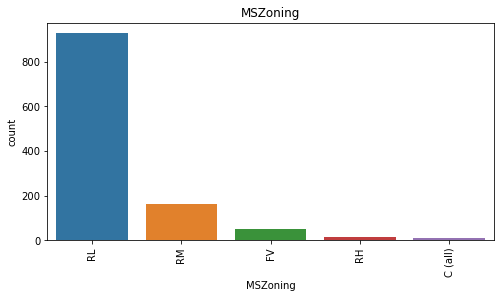

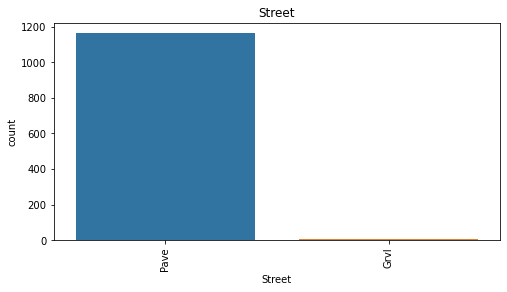

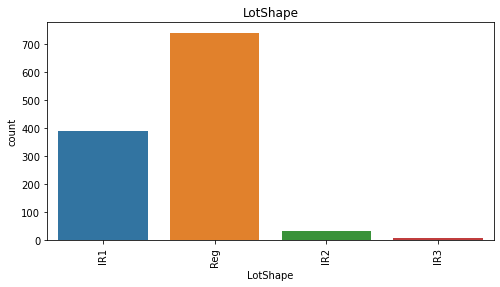

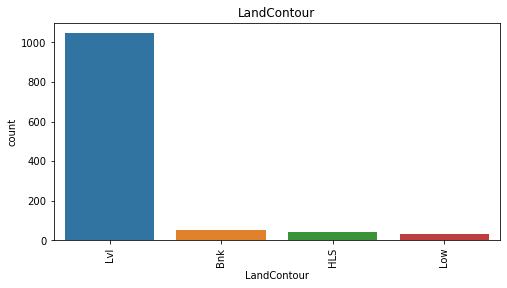

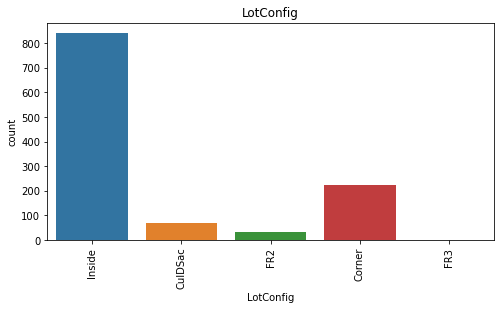

...

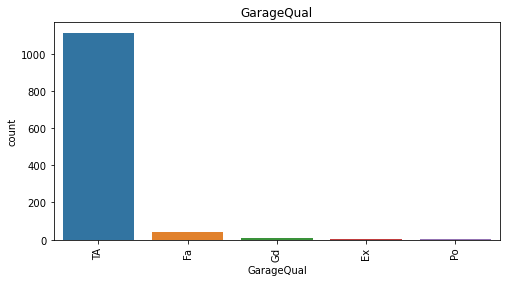

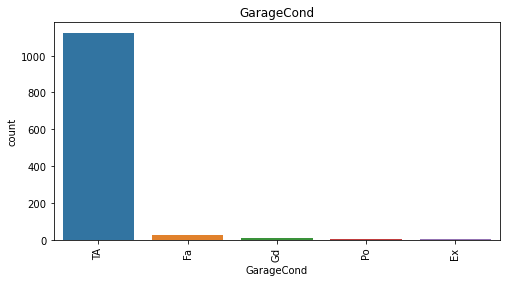

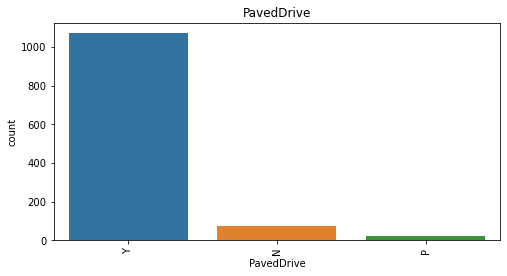

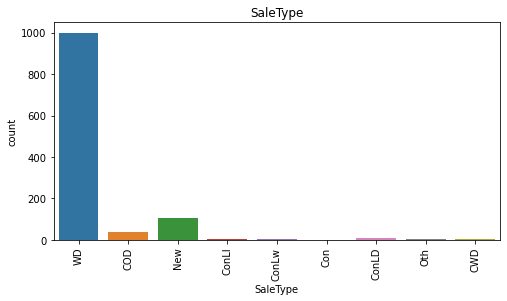

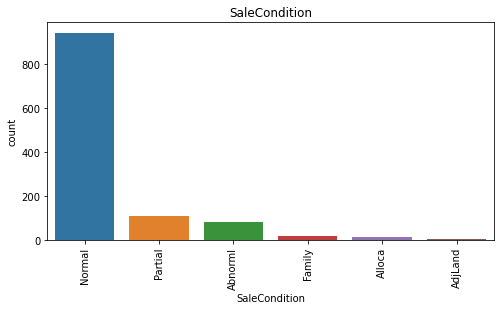

In [197]:
#Distribution plot for all categorical columns
for i in df[categorical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.countplot(x=df[i],data=df)
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

Observations:
1.	For Floating Village Residential (FV) and Residential Low Density(RL) zoning classification of the sale(MSZoning) the SalePrice is high.
2.	For paved type of road access to property (Street) the SalePrice is high.
3.	For Slightly irregular (IR1), Moderately Irregular (IR2) and Irregular (IR3) shape of property (LotShape) the SalePrice is high.
4.	For Hillside - Significant slope from side to side (HLS) Flatness of the property (LandContour) the SalePrice is High.
5.	For Cul-de-sac (CulDSac) Lot configuration (LotConfig) the SalePrice is High.
6.	For all types of Slope of property (LandSlope) i.e., Gentle slope (Gtl), Moderate Slope (Mod) and Severe Slope (Sev) the SalePrice is High.
7.	For Northridge (NoRidge) locations within Ames city limits (Neighborhood) the SalePrice is High.
8.	For Within 200' of North-South Railroad (RRNn), Adjacent to postive off-site feature (PosA) and Near positive off-site feature--park, greenbelt, etc. (PosN) Proximity to various conditions(Condition1) has the maximum SalePrice.
9.	For Adjacent to positive off-site feature (PosA) and Near positive off-site feature--park, greenbelt, etc.(PosN) Proximity to various conditions (if more than one is present) (Condition2) has maximum SalePrice.
10.	For Single-family Detached(1Fam) and Townhouse End Unit (TwnhsE) type of dwelling (BldgType) the SalePrice is high.
11.	 For 2Story and Two and one-half story: 2nd level finished(2.5Fin) Style of dwelling (HouseStyle) the SalePrice is high.
12.	For Shed Type of roof (RoofStyle) the SalePrice is high.
13.	 For Wood Shingles (WdShngl) Roof material (RoofMat1) the SalePrice is high.
14.	 For Cement Board (CemntBd), Imitation Stucco (ImStucc) and Stone type of Exterior covering on house(Exterior1st) the SalePrice is high.
15.	 For Cement Board (CemntBd), Imitation Stucco (ImStucc) and other Exterior covering on house (if more than one material) (Exterior2) has maximum SalePrice.
16.	For Stone Masonry veneer type (MasvnrType) the SalePrice is high.
17.	For Excellent (Ex) quality of the material on the exterior(ExterQual) the SalePrice is high.
18.	For Excellent (Ex) present condition of the material on the exterior (ExterCond) the SalePrice is high.
19.	For Poured Contrete (PConc) Type of foundation (Foundation) the SalePrice is high.
20.	For Excellent (100+ inches) (Ex) height of the basement (BsmtQual) the SalePrice is high.
21.	For Good (Gd) general condition of the basement (BsmtCond) the SalePrice is high.
22.	For Good Exposure (Gd) of walkout or garden level walls (BsmtExposure) has maximum SalePrice.
23.	For Good Living Quarters (GLQ) of basement finished area (BsmtFinType1) has maximum SalePrice.
24.	For Good Living Quarters (GLQ) and Average Living Quarters (ALQ) of basement finished area (if multiple types) (BsmtFinType2) has maximum SalePrice. 
25.	For Gas forced warm air furnace (GasA) and	Gas hot water or steam heat (GasW) Type of heating(Heating) has high SalePrice.
26.	For Excellent (Ex) Heating quality and condition (HeatingQC) the SalePriceis high.
27.	For building having Central air conditioning (CentralAir) the SalePrice is high.
28.	For Standard Circuit Breakers & Romex (Sbrkr) of Electrical system (Electrical) the SalePrice is Maximum.
29.	 For Excellent (Ex) Kitchen quality (KitchenQual) the SalePrice is high.
30.	For Typical Functionality (Typ) type of Home functionality (Assume typical unless deductions are warranted) (Functional) the SalePrice is high.
31.	For Excellent - Exceptional Masonry Fireplace (Ex) of Fireplace quality (FireplaceQual) has highest SalePrice. 
32.	For Built-In (Garage part of house - typically has room above garage) (BuiltIn) Garage location (GarageType) the SalePrice is maximum.
33.	For Completely finished (Fin) Interior of the garage (GarageFinish) the SalePrice is high.
34.	 For Excellent (Ex) Garage quality (GarageQual) the SalePrice is high.
35.	 For Typical/Average (TA) and Good (Gd) Garage condition (GarageCond) the SalePrice is high.
36.	 For having Paved driveway (PavedDrive) the SalePriceis high.
37.	For Home just constructed and sold (New) and Contract 15% Down payment regular terms (Con) of type of sale (SaleType) has highest SalePrice.
38.	For Home was not completed when last assessed (associated with New Homes) (Partial) Condition of sale (SalesCondition) the SalePrice is maximum.


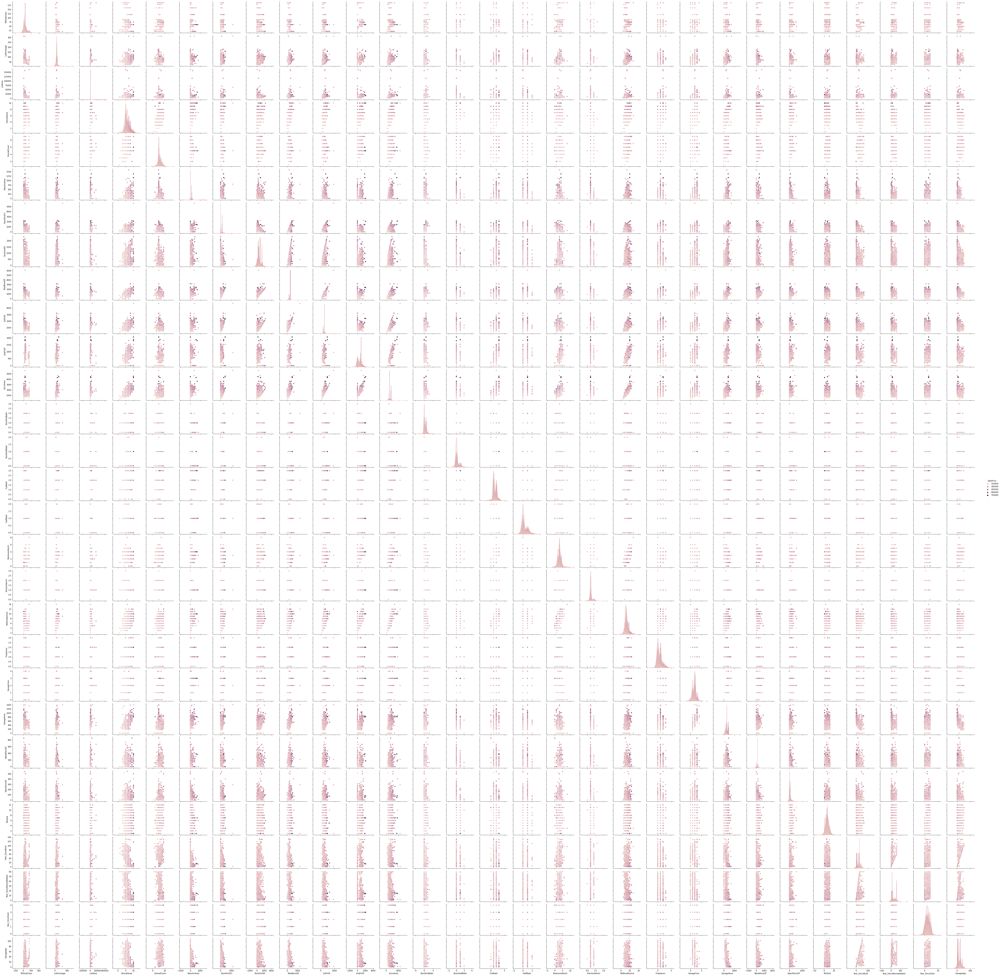

In [198]:
sns.pairplot(df, hue ='SalePrice')

Observations:
1.	For 1-STORY 1946 & NEWER ALL STYLES (20) and 2-STORY 1946 & NEWER (60) types of dwelling (MSSuubClass) the sales is good and SalePrice is also high.
2.	As Rates the overall material and finish of the house (OverallQual) is increasing linearly sales is also increasing And SalePrice is also increasing linearly.
3.	For 5(Average) overall condition of the house (OverallCond) the sales is high and SalePrice is also high.
4.	For 0 and 1 Basement full bathrooms (BsmtFullBath) the sales as well as SalePrice is high.
5.	For 0 Basement half bathrooms (BsmtHalfBath) the sales as well as SalePrice is high.
6.	For 1 and 2 Full bathrooms above grade (FullBath) the sales as well as SalePrice is high.
7.	For 0 and 1 Half baths above grade (HalfBath) the sales as well as SalePrice is high.
8.	For 2, 3 and 4 Bedrooms above grade (does NOT include basement bedrooms) (BedroomAbvGr) the sales as well as SalePrice is high.
9.	For 1 Kitchens above grade (KitchenAbvGr) the sales as well as SalePrice is high.
10.	For 4-9 Total rooms above grade (does not include bathrooms) (TotRmsAbvGrd) the sales as well as SalePrice is high.
11.	For 0 and 1 Number of fireplaces (Fireplaces) the sales as well as SalePrice is high.
12.	For 1 and 2 Size of garage in car capacity (GarageCars) the sales is high and for 3 Size of garage in car capacity (GarageCars) the SalePrice is high.
13.	In between april to august for Month Sold (MoSold) the sales is good with SalePrice.
14.	For all the Year_SinceSold the SalePrice and sales both are same.


## Checking for outliers in training data:

MSSubClass                 AxesSubplot(0.125,0.749828;0.0824468x0.130172)
LotFrontage             AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
LotArea                 AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
OverallQual             AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
OverallCond             AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
MasVnrArea              AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
BsmtFinSF1              AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
BsmtUnfSF               AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
TotalBsmtSF                AxesSubplot(0.125,0.593621;0.0824468x0.130172)
1stFlrSF                AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
2ndFlrSF                AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
GrLivArea               AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
BsmtFullBath            AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
BsmtHalfBath            AxesSubplot(0.

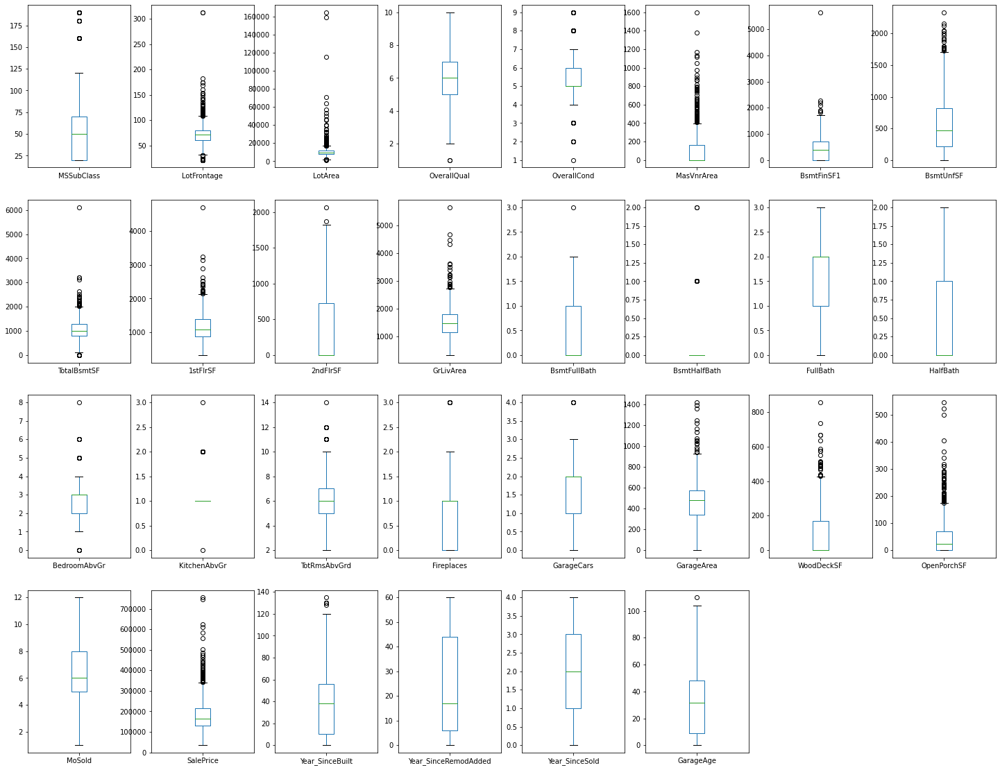

In [199]:
# to find out outliers in the dataset
df.plot(kind='box',subplots=True,layout=(5,8),figsize=(25,25))

Following are the columns with outliers in train dataset-
* MSSubClass
* LotFrontage
* LotArea
* OverallQual
* OverallCond
* MasVnrArea
* BsmtFinSF1
* BsmtUnfSF
* TotalBsmtSF
* 1stFlrSF
* 2ndFlrSF
* GrLivArea
* BsmtFullBath
* BsmtHalfBath
* BedroomAbvGr
* KitchenAbvGr
* TotRmsAbvGrd
* Fireplaces
* GarageCars
* GarageArea
* WoodDeckSF
* OpenPorchSF
* Year_SinceBuilt
* GarageAge
* SalePrice
outliers in SalePrice will not removed as it is our target column.

MSSubClass, OverallQual and OverallCond are of int data type. However,the data in it seems to be categorical so, these column outliers will not be removed.

## Removing Outliers in training dataset:

In [51]:
#Features having outliers in train dataset
features=df[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath','BsmtHalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','GarageArea','WoodDeckSF',
'OpenPorchSF','Year_SinceBuilt','GarageAge']]

In [52]:
# to Remove outliers using percentile method in train dataset
for col in features:
    if df[col].dtypes != 'object':
        percentile = df[col].quantile([0.01,0.98]).values
        df[col][df[col]<=percentile[0]]=percentile[0]
        df[col][df[col]>=percentile[1]]=percentile[1]

In [53]:
df.shape

(1168, 68)

MSSubClass                 AxesSubplot(0.125,0.749828;0.0824468x0.130172)
LotFrontage             AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
LotArea                 AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
OverallQual             AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
OverallCond             AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
MasVnrArea              AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
BsmtFinSF1              AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
BsmtUnfSF               AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
TotalBsmtSF                AxesSubplot(0.125,0.593621;0.0824468x0.130172)
1stFlrSF                AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
2ndFlrSF                AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
GrLivArea               AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
BsmtFullBath            AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
BsmtHalfBath            AxesSubplot(0.

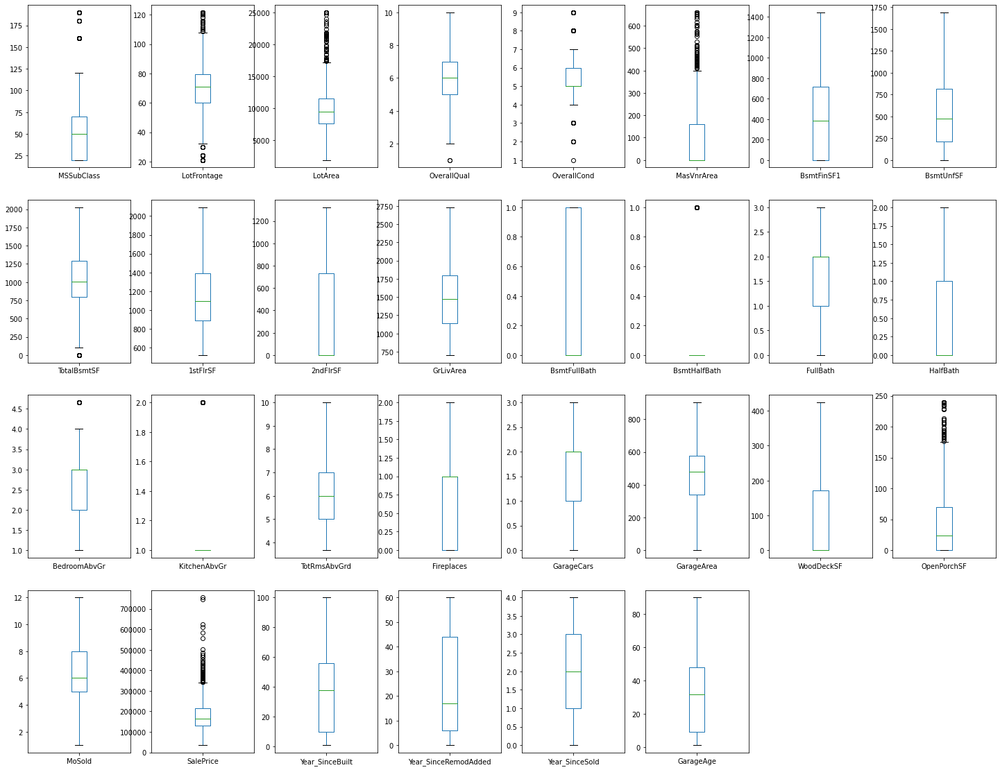

In [54]:
# to find out outliers in the dataset
df.plot(kind='box',subplots=True,layout=(5,8),figsize=(25,25))

Most of the outliers have been removed.

## Checking for skewness in training dataset:

In [55]:
# to Check skewness of train dataset
df.skew()

MSSubClass              1.422019
LotFrontage             0.188060
LotArea                 1.191912
OverallQual             0.175082
OverallCond             0.580714
MasVnrArea              1.873138
BsmtFinSF1              0.639523
BsmtUnfSF               0.777624
TotalBsmtSF             0.166773
1stFlrSF                0.645842
2ndFlrSF                0.717390
GrLivArea               0.592755
BsmtFullBath            0.355224
BsmtHalfBath            3.954345
FullBath                0.057809
HalfBath                0.656492
BedroomAbvGr           -0.145762
KitchenAbvGr            4.374289
TotRmsAbvGrd            0.443931
Fireplaces              0.552677
GarageCars             -0.434745
GarageArea             -0.135675
WoodDeckSF              1.053617
OpenPorchSF             1.513678
MoSold                  0.220979
SalePrice               1.953878
Year_SinceBuilt         0.468682
Year_SinceRemodAdded    0.495864
Year_SinceSold         -0.115765
GarageAge               0.608757
dtype: flo

## Checking for outliers in testing data:

MSSubClass                 AxesSubplot(0.125,0.749828;0.0824468x0.130172)
LotFrontage             AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
LotArea                 AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
OverallQual             AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
OverallCond             AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
MasVnrArea              AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
BsmtFinSF1              AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
BsmtUnfSF               AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
TotalBsmtSF                AxesSubplot(0.125,0.593621;0.0824468x0.130172)
1stFlrSF                AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
2ndFlrSF                AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
GrLivArea               AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
BsmtFullBath            AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
BsmtHalfBath            AxesSubplot(0.

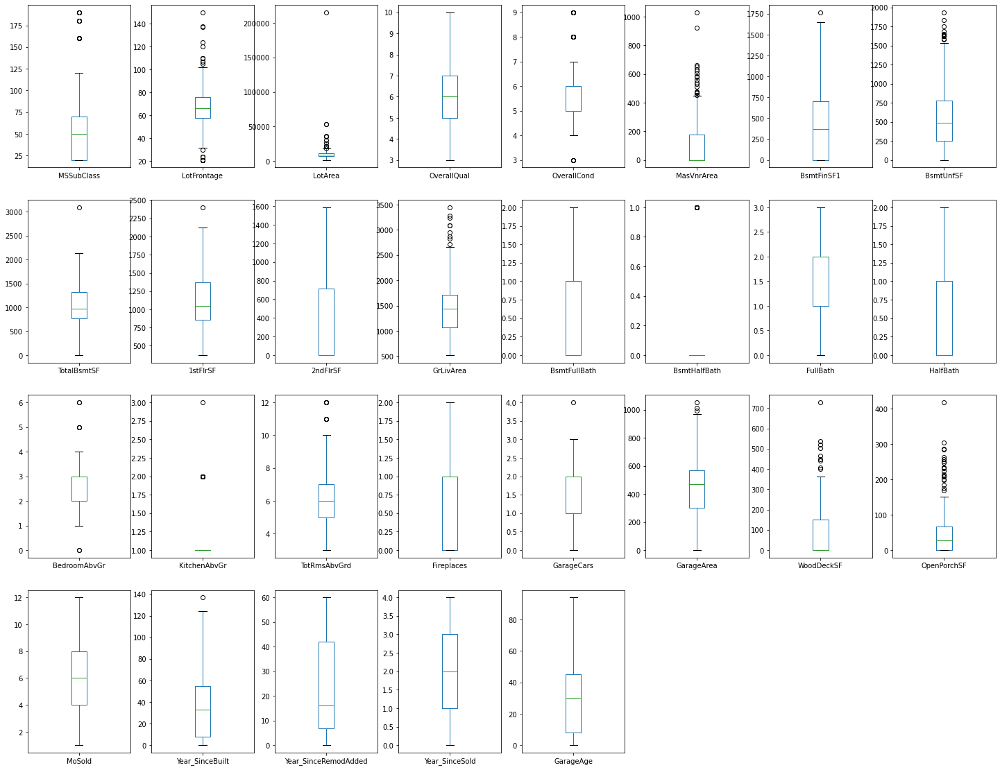

In [56]:
# to find out outliers in the dataset
df1.plot(kind='box',subplots=True,layout=(5,8),figsize=(25,25))

The columns with outliers in test dataset are
* MSSubClass
* LotFrontage
* LotArea
* OverallCond
* MasVnrArea
* BsmtFinSF1
* BsmtUnfSF
* TotalBsmtSF
* 1stFlrSF
* GrLivArea
* BsmtHalfBath
* BedroomAbvGr
* KitchenAbvGr
* TotRmsAbvGrd
* GarageCars
* GarageArea
* WoodDeckSF
* OpenPorchSF
* Year_SinceBuilt

MSSubClass and OverallCond are of int data type. However,the data in it seems to be categorical so, these column outliers will not be removed.

## Removing Outliers in testing dataset:

In [57]:
#Features having outliers in test dataset
features1=df1[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','GrLivArea','BsmtHalfBath','BedroomAbvGr',
               'KitchenAbvGr','TotRmsAbvGrd','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','Year_SinceBuilt']]

In [58]:
# to Remove outliers using percentile method in test dataset
for col1 in features1:
    if df1[col1].dtypes != 'object':
        percentile = df1[col1].quantile([0.01,0.98]).values
        df1[col][df1[col]<=percentile[0]]=percentile[0]
        df1[col][df1[col]>=percentile[1]]=percentile[1]

In [59]:
df.shape

(1168, 68)

MSSubClass                 AxesSubplot(0.125,0.749828;0.0824468x0.130172)
LotFrontage             AxesSubplot(0.223936,0.749828;0.0824468x0.130172)
LotArea                 AxesSubplot(0.322872,0.749828;0.0824468x0.130172)
OverallQual             AxesSubplot(0.421809,0.749828;0.0824468x0.130172)
OverallCond             AxesSubplot(0.520745,0.749828;0.0824468x0.130172)
MasVnrArea              AxesSubplot(0.619681,0.749828;0.0824468x0.130172)
BsmtFinSF1              AxesSubplot(0.718617,0.749828;0.0824468x0.130172)
BsmtUnfSF               AxesSubplot(0.817553,0.749828;0.0824468x0.130172)
TotalBsmtSF                AxesSubplot(0.125,0.593621;0.0824468x0.130172)
1stFlrSF                AxesSubplot(0.223936,0.593621;0.0824468x0.130172)
2ndFlrSF                AxesSubplot(0.322872,0.593621;0.0824468x0.130172)
GrLivArea               AxesSubplot(0.421809,0.593621;0.0824468x0.130172)
BsmtFullBath            AxesSubplot(0.520745,0.593621;0.0824468x0.130172)
BsmtHalfBath            AxesSubplot(0.

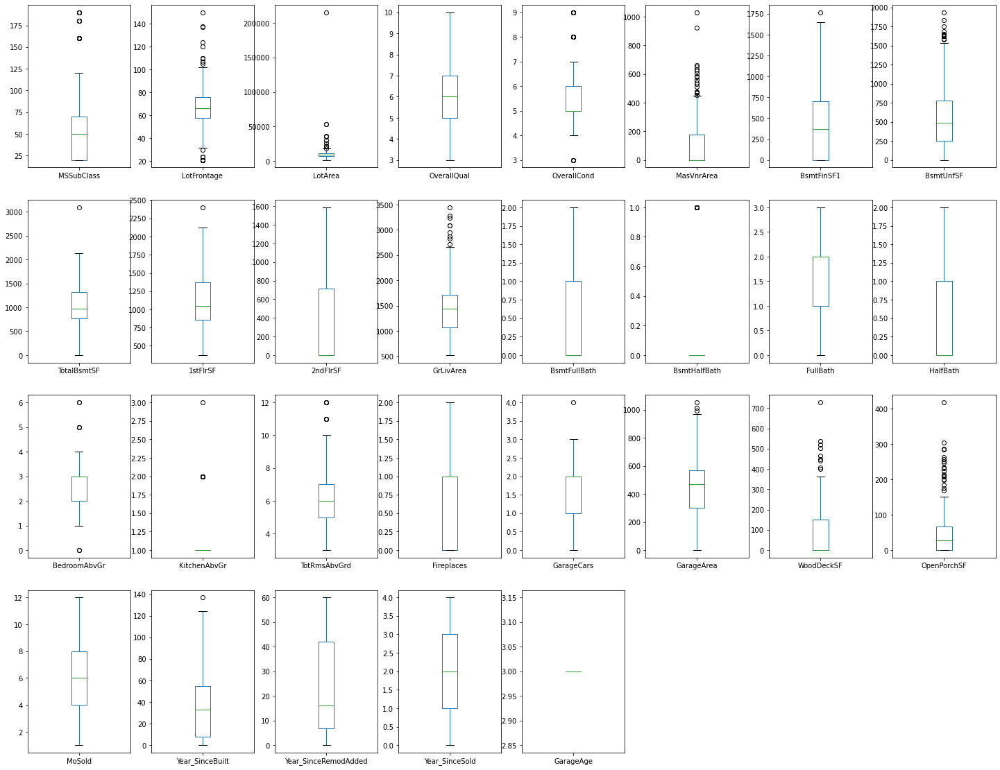

In [60]:
# to find out outliers in the dataset
df1.plot(kind='box',subplots=True,layout=(5,8),figsize=(25,25))

## Checking for skewness:

In [61]:
#Checking for skewness of train dataset
df1.skew()

MSSubClass               1.358597
LotFrontage              0.466813
LotArea                 12.781805
OverallQual              0.397312
OverallCond              1.209714
MasVnrArea               1.976804
BsmtFinSF1               0.739790
BsmtUnfSF                0.960708
TotalBsmtSF              0.519257
1stFlrSF                 0.692047
2ndFlrSF                 0.765511
GrLivArea                1.010586
BsmtFullBath             0.463685
BsmtHalfBath             3.544994
FullBath                -0.049800
HalfBath                 0.758892
BedroomAbvGr             0.075315
KitchenAbvGr             4.849432
TotRmsAbvGrd             0.805535
Fireplaces               0.540164
GarageCars              -0.280324
GarageArea               0.133547
WoodDeckSF               1.708221
OpenPorchSF              2.185030
MoSold                   0.186504
Year_SinceBuilt          0.755233
Year_SinceRemodAdded     0.535600
Year_SinceSold          -0.018412
GarageAge                0.000000
dtype: float64

Outliers in MSSubClass and OverallCond will not be removed as they are categorical columns.

In LotFrontage skewness is zero which means all the entries in this column are same so let's drop it in test dataset. Since dropped in test let's drop in train data also.

In [62]:
#to Drop unnecessary column in train dataset
df = df.drop(["LotFrontage"],axis=1)

In [63]:
# to Drop unnecessary column in test dataset
df1 = df1.drop(["LotFrontage"],axis=1)

## Removing skewness using yeo-johnson method for train dataset:

In [64]:
# to Creat a list of skewed features in train dataset
fea=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtHalfBath','HalfBath','KitchenAbvGr','Fireplaces',
     'WoodDeckSF','OpenPorchSF']

In [65]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [66]:
df[fea] = scaler.fit_transform(df[fea].values)

In [67]:
#Checking skewness again in train dataset
df[fea].skew()

LotArea         0.077862
MasVnrArea      0.415092
BsmtFinSF1     -0.418554
BsmtUnfSF      -0.304290
1stFlrSF       -0.000731
2ndFlrSF        0.279883
GrLivArea      -0.005974
BsmtHalfBath    3.954345
HalfBath        0.498003
KitchenAbvGr    0.000000
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
dtype: float64

In [68]:
#Dropping unnecessary column
df = df.drop(["KitchenAbvGr"],axis=1)

In KitchenAbvGr skewness is zero which means all the entries in this column are same so let's drop.

## moving skewness using yeo-johnson method for test dataset:

In [69]:
#Creating a list of skewed features in test dataset
fea1=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtHalfBath','HalfBath',
      'KitchenAbvGr','TotRmsAbvGrd','OpenPorchSF','Year_SinceBuilt','GarageAge']

In [70]:
df1[fea1] = scaler.fit_transform(df1[fea1].values)

In [71]:
#Checking skewness again in train dataset
df1[fea1].skew()

LotArea            0.003111
MasVnrArea         0.363253
BsmtFinSF1        -0.441605
BsmtUnfSF         -0.232099
1stFlrSF          -0.000548
2ndFlrSF           0.284246
GrLivArea         -0.000307
BsmtHalfBath       3.544994
HalfBath           0.621093
KitchenAbvGr       4.253608
TotRmsAbvGrd      -0.000469
OpenPorchSF       -0.058951
Year_SinceBuilt   -0.147007
GarageAge          0.000000
dtype: float64

skewness of KitchenAbvGr still 4.2536.however,as this column has been dropped in training dataset let's drop in test dataset too.

In [72]:
# to Drop unnecessary column
df1 = df1.drop(["KitchenAbvGr"],axis=1)

In [73]:
df.shape

(1168, 66)

In [74]:
df1.shape

(292, 65)

## Ordinal Encoding:

In [75]:
#Ordinal encoding for train dataset
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))

In [76]:
#Ordinal encoding for test dataset
for i in df1.columns:
    if df1[i].dtypes=='object':
        df1[i]=OE.fit_transform(df1[i].values.reshape(-1,1))

In [77]:
df.head(3)

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,3.0,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1.0,1.0,8.0,9.0,2.0,-0.822896,3.0,4.0,1.0,2.0,3.0,3.0,0.0,-0.117054,5.0,0.916764,1078.00,1.0,4.0,1.0,4.0,-0.481887,-0.871789,-1.281768,0,-0.238775,2,-0.782707,2.0,3.0,5.0,6.0,0.779453,4.0,1.0,1.0,2,440.0,4.0,4.0,2.0,-0.960144,1.423871,2,8.0,4.0,128000,34,34,3,33.0
1,20,3.0,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,0.0,5.0,12.0,13.0,2.0,-0.822896,2.0,2.0,2.0,3.0,1.0,1.0,0.0,0.395541,4.0,1.042594,2025.14,1.0,0.0,1.0,4.0,2.082190,-0.871789,1.377184,1,-0.238775,2,-0.782707,4.0,2.0,8.0,6.0,0.779453,4.0,1.0,2.0,2,621.0,4.0,4.0,2.0,0.783831,1.428474,10,8.0,4.0,268000,40,40,3,40.0
2,60,3.0,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,7.0,7.0,2.0,-0.822896,2.0,4.0,2.0,2.0,3.0,0.0,2.0,0.934402,5.0,-0.510359,1117.00,1.0,0.0,1.0,4.0,0.048689,1.177246,1.060650,1,-0.238775,2,1.268421,3.0,3.0,8.0,6.0,0.779453,4.0,1.0,2.0,2,455.0,4.0,4.0,2.0,1.047285,1.208580,6,8.0,4.0,269790,14,13,3,13.0


In [78]:
df1.head(3)

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,20,2.0,0.842656,1.0,0.0,1.0,0.0,0.0,21.0,2.0,0.0,0.0,2.0,9,5,3.0,0.0,9.0,11.0,3.0,1.182923,2.0,3.0,2.0,0.0,2.0,1.0,2.0,1.205140,5.0,0.455087,1922,0.0,0.0,1.0,3.0,1.814725,-0.870294,0.943726,1,-0.263813,2,-0.738058,3,2.0,0.961793,5.0,1,2.0,1.0,0.0,3,676,4.0,4.0,2.0,178,0.718308,7,5.0,2.0,-1.301385,4,3,0.0
1,120,2.0,-0.739104,1.0,0.0,3.0,1.0,0.0,21.0,2.0,0.0,4.0,2.0,8,5,1.0,0.0,5.0,5.0,2.0,-0.846534,2.0,3.0,1.0,2.0,2.0,0.0,2.0,1.064798,5.0,-0.841820,1220,0.0,2.0,1.0,3.0,0.726749,-0.870294,-0.077517,1,-0.263813,1,-0.738058,1,2.0,-1.618327,5.0,1,0.0,1.0,1.0,2,565,4.0,4.0,2.0,63,-1.111540,8,0.0,0.0,-0.063464,26,1,0.0
2,20,2.0,0.524304,1.0,3.0,3.0,4.0,0.0,4.0,2.0,0.0,0.0,2.0,8,5,3.0,0.0,9.0,11.0,2.0,-0.846534,2.0,3.0,2.0,2.0,2.0,0.0,5.0,-1.375716,5.0,2.127575,1753,0.0,0.0,1.0,3.0,1.586900,-0.870294,0.729670,0,-0.263813,2,-0.738058,3,0.0,0.447622,5.0,1,4.0,1.0,1.0,2,522,4.0,4.0,2.0,202,1.278346,6,5.0,2.0,-0.932033,9,1,0.0


## Checking correlation using heat map:
**In training and testing dataset**

In [79]:
#Correlation of train dataset
cor=df.corr().T
cor

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
MSSubClass,1.000000,0.007478,-0.400825,-0.035981,0.104485,-0.021387,0.076880,-0.014930,0.013918,-0.042474,-0.044319,0.731815,0.381585,0.070462,-0.056978,-0.100641,-0.032214,-0.090178,-0.120022,-0.013252,0.022091,-0.024133,0.004186,0.053951,-0.052242,-0.013220,-0.068192,0.017515,-0.041361,0.040573,-0.133695,-0.229300,0.047734,-0.001994,-0.113883,0.045533,-0.264403,0.355020,0.096452,-0.011290,-0.000125,0.140807,0.165938,-0.037908,-0.011378,0.049001,0.022913,-0.032338,0.024708,0.077469,-0.000067,-0.031897,-0.097615,-0.010568,-0.025595,-0.068702,0.016371,0.025996,-0.016015,0.035050,-0.028981,-0.060775,-0.031787,-0.056618,0.038595,-0.077611
MSZoning,0.007478,1.000000,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,0.184815,-0.099269,-0.244844,0.123822,0.002336,0.037414,0.021518,-0.036041,-0.031322,-0.032954,-0.065060,0.051188,0.119852,-0.015887,-0.079205,-0.037611,-0.016193,-0.086858,-0.009900,0.006809,-0.188837,-0.125164,-0.000610,0.111689,-0.024508,-0.091684,0.009349,0.005628,0.125155,0.162566,-0.130963,-0.163414,-0.168881,-0.087375,-0.077280,0.006946,-0.182359,-0.051646,0.079854,0.004501,-0.133221,0.296752,0.174586,0.004964,0.263644
LotArea,-0.400825,-0.058912,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,-0.104632,-0.013921,0.009319,-0.123151,-0.006375,-0.144857,-0.043423,0.119301,-0.073788,0.052521,0.332367,-0.021160,-0.022308,0.073866,0.053827,0.452791,0.009290,0.397820,0.108691,0.043299,0.187219,0.061575,0.297515,-0.113870,0.369388,-0.025038,0.328380,0.130931,-0.201895,-0.155464,0.272560,0.319552,0.004145,0.043327,0.041033,0.125098,0.146222,0.021311,-0.022130,0.046115,0.394343,-0.028547,-0.028632,0.039843,0.022709
Street,-0.035981,0.140215,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.044509,0.017738,0.032701,-0.031959,-0.017190,0.065253,-0.006420,0.008924,0.045208,0.030988,0.016841,0.006981,-0.047968,0.043024,0.038720,0.009913,0.026241,0.052837,-0.010398,0.013997,0.033208,0.045883,0.028722,-0.012056,0.039782,-0.015309,0.021069,0.025218,-0.000824,-0.001178,0.001838,-0.002976,-0.012622,-0.010973,0.041318,0.022918,0.017900,-0.008860,0.025920,0.014176,0.044753,-0.021386,-0.057866,0.019635,-0.014692
LotShape,0.104485,0.053655,-0.287003,-0.012941,1.000000,0.081803,0.211395,-0.101187,-0.031852,-0.136885,-0.032926,0.099822,-0.116280,-0.189636,0.026931,-0.012410,-0.091341,-0.033798,-0.034674,-0.006337,-0.085608,0.158076,-0.047098,-0.136443,0.162217,-0.026293,0.123908,0.099214,-0.093947,0.029741,-0.028501,-0.175763,0.071484,0.092617,-0.113719,-0.090459,-0.178607,-0.001494,-0.185027,-0.071806,-0.016422,-0.175359,-0.128573,-0.063110,0.122861,-0.124836,-0.012018,-0.193907,-0.155353,0.160087,0.239653,-0.187013,-0.164503,-0.097438,-0.068449,-0.122756,-0.140805,-0.153646,-0.050418,-0.015161,-0.054905,-0.248171,0.231550,0.155428,-0.021421,0.190992
LandContour,-0.021387,0.001175,-0.074834,0.105226,0.081803,1.000000,-0.031496,-0.386787,0

Above are the correlations of all the pair of features of train dataset.To get better visualization on the correlation of features,let me plot it using heat map.

<AxesSubplot:>

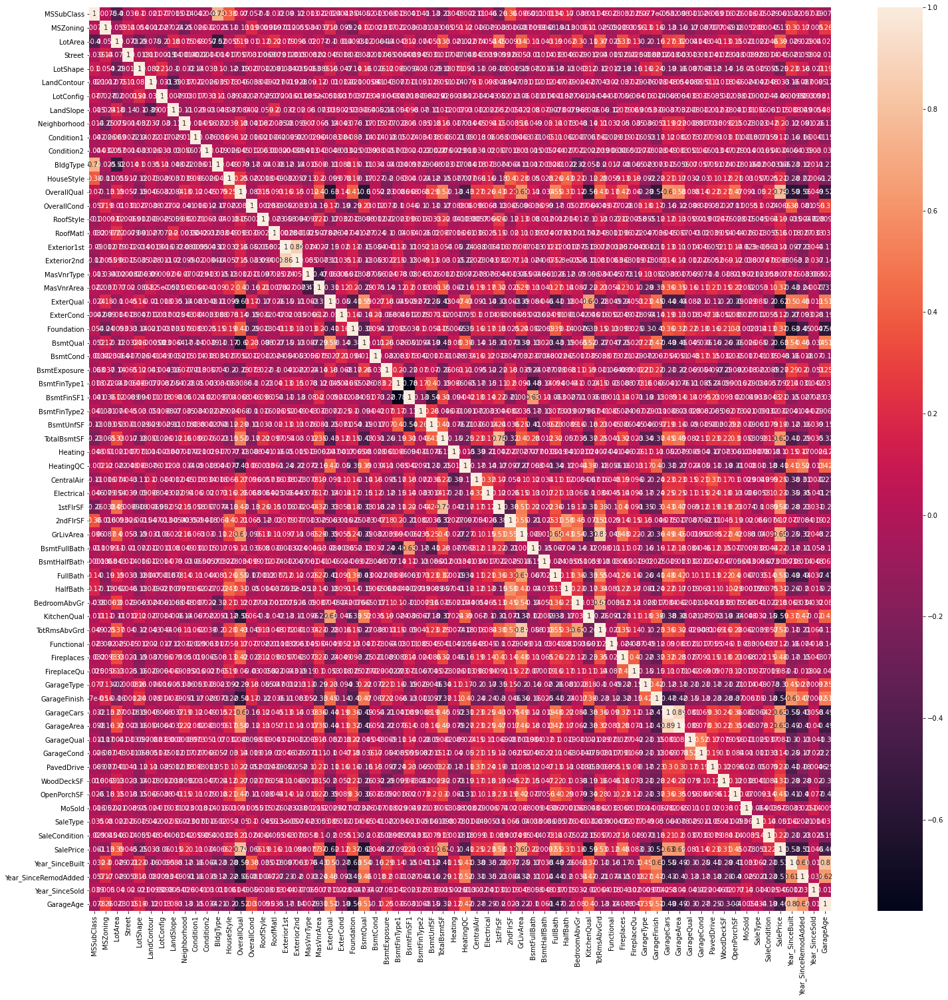

In [80]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),color ='k',annot=True)

multicollinearity can be observed in few columns.

In [81]:
#Correlation of test dataset
cor1=df1.corr().T
cor1

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
MSSubClass,1.000000,0.266517,-0.559657,0.004588,0.176681,0.068736,0.071784,-0.073979,-0.081962,0.042599,-0.036770,0.798007,0.455233,-0.116077,-0.068113,-0.183492,-0.019367,-0.103303,-0.202425,-0.092343,0.041990,0.009859,-0.051525,0.072808,0.000375,-0.015342,-0.049358,0.003453,-0.080689,0.043449,-0.196697,-0.336822,0.049709,0.118102,-0.053192,0.075568,-0.390978,0.400684,0.030653,-0.000676,-0.041577,0.095903,0.210890,-0.061750,0.093439,-0.031809,-0.075457,-0.084663,0.068302,0.143455,0.059519,-0.086798,-0.122536,0.076650,0.107296,-0.024900,0.028190,-0.104641,-0.004079,-0.105307,-0.010155,-0.024612,0.023317,-0.044441,NaN
MSZoning,0.266517,1.000000,-0.335805,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,0.010358,-0.125356,0.245917,-0.096395,-0.195382,0.138389,-0.111940,0.050552,0.038716,-0.140046,-0.015825,-0.140089,-0.270929,0.094397,0.228922,-0.235065,-0.035888,-0.227152,0.017233,-0.211886,-0.084559,-0.017534,-0.236326,-0.181873,-0.104881,0.198917,-0.153357,-0.131738,-0.148498,-0.090561,0.142661,0.233188,-0.306561,-0.304614,-0.081278,-0.070219,-0.236680,-0.055536,-0.185326,0.074308,0.123993,0.005290,0.365869,0.159359,0.072716,NaN
LotArea,-0.559657,-0.335805,1.000000,-0.099348,-0.294907,-0.139905,-0.150922,0.429145,0.184733,0.059812,-0.034579,-0.588876,-0.082811,0.217092,-0.099886,0.234422,0.035262,0.070080,0.090332,0.002839,0.057879,-0.155186,0.027581,0.073686,-0.066873,0.036724,-0.171785,0.003165,0.136856,-0.008923,0.113707,0.408620,0.059190,-0.127660,0.060219,-0.001966,0.495823,-0.052562,0.397836,0.148346,0.067735,0.210105,0.066096,0.307383,-0.162503,0.399155,0.047121,0.317227,-0.038484,-0.205593,-0.245896,0.335243,0.350725,0.069671,-0.036516,-0.017594,0.138016,0.134890,-0.045307,0.076505,0.058346,-0.079597,-0.057241,-0.017708,NaN
Street,0.004588,-0.063162,-0.099348,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,0.036783,-0.015019,0.071241,-0.027138,0.043091,-0.021395,-0.018187,0.099047,-0.037657,-0.038548,0.110019,0.095286,-0.029632,0.011782,-0.085239,0.156680,-0.025961,-0.012989,0.072274,0.050722,-0.094062,0.021908,0.087362,-0.025380,0.030347,-0.062637,0.067617,-0.018670,-0.054111,-0.059024,0.006743,-0.029487,-0.084965,-0.117624,-0.018018,-0.015090,-0.023367,0.022791,-0.019373,0.036965,-0.019125,-0.012345,-0.046874,-0.092244,0.040272,NaN
LotShape,0.176681,0.167716,-0.294907,-0.002444,1.000000,0.100105,0.262901,-0.094606,-0.067832,-0.022692,-0.082226,0.178101,-0.056015,-0.193911,-0.041775,0.064795,0.058711,0.038251,0.013260,0.063936,-0.172854,0.109340,0.029383,-0.130809,0.157618,0.045827,0.208981,0.027413,-0.164947,0.012487,0.006681,-0.203827,0.096532,0.132497,-0.122514,-0.119587,-0.178283,0.038546,-0.141972,-0.110572,-0.061833,-0.094588,-0.074268,-0.031843,0.118826,-0.105421,-0.100522,-0.240595,0.001456,0.203748,0.198932,-0.183139,-0.191254,-0.075886,-0.065757,-0.075440,-0.270154,-0.051912,0.033461,0.072375,0.033945,0.172947,0.147522,-0.097144,NaN
LandContour,0.068736,-0.099137,-0.139905,0.153613,0.100105,1.000000,-0.000623,-0.317244,-0.056007,0.055705,0.017545,0.109774,0.085180,-0.040573,-0.073580,-0.058431,0

<AxesSubplot:>

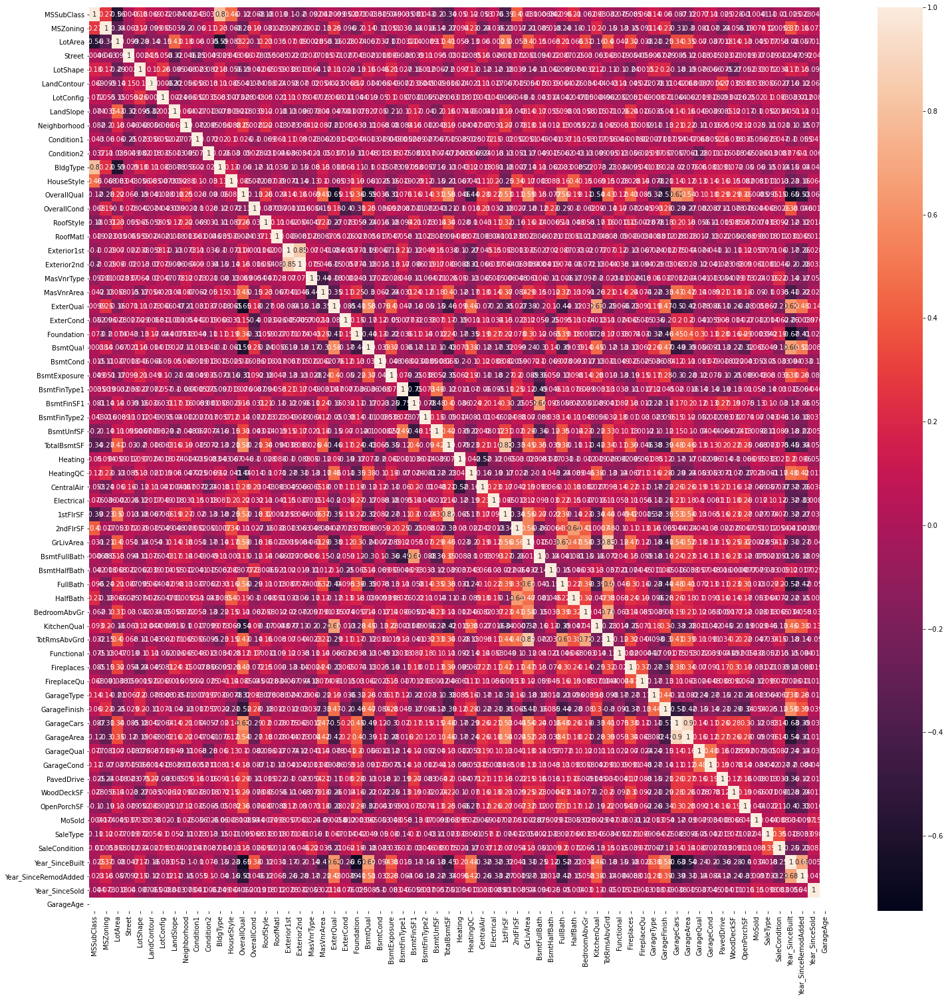

In [82]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,25))
sns.heatmap(df1.corr(),color ='k',annot=True)

multicolinearity can be observed. 

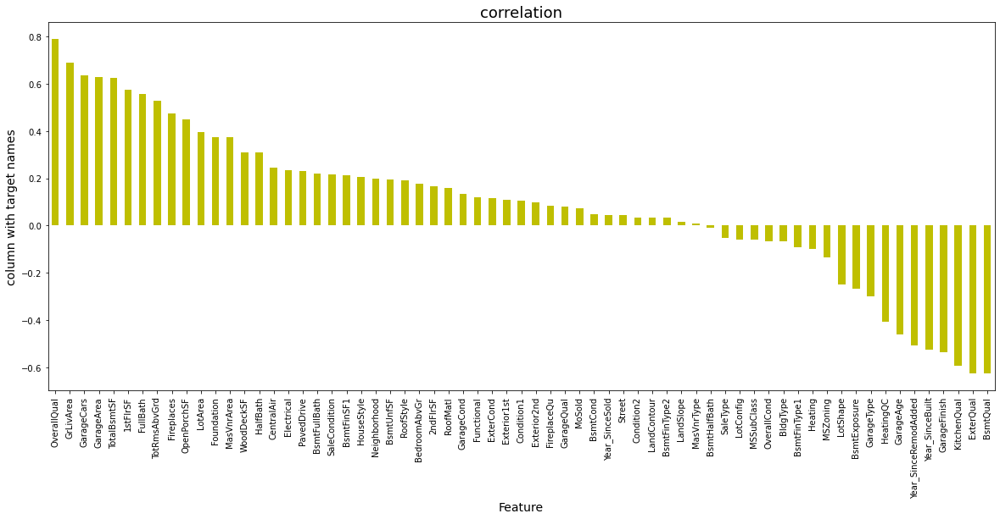

In [83]:
plt.figure(figsize=(20,8))
df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='y')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

Clearly i can see that MasVnrType and ForeplaceQu are less correlated with target but let me keep those columns as it is and continue.

## Separating features and label in train dataset:

In [84]:
# to separate target column
x = df.drop("SalePrice",axis=1)
y = df["SalePrice"]

## Scaling the train data using standard scaler:

In [85]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [86]:
X.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,1.508301,-0.021646,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,0.671093,0.369322,-0.557836,-0.329500,0.293234,0.635539,-1.523529,-0.117054,0.310141,0.916764,0.067300,-0.11909,1.390230,0.267506,0.299036,-0.481887,-0.871789,-1.281768,-0.838227,-0.238775,0.793082,-0.782707,-1.144966,0.806154,-1.009429,0.261146,0.779453,1.778446,-0.693653,-0.288773,0.307737,-0.163806,0.215316,0.187193,0.291828,-0.960144,1.423871,-1.617822,0.330033,0.207932,-0.162248,0.421565,0.605487,0.054063
1,-0.877042,-0.021646,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,-0.759266,-2.318331,0.852451,0.836731,-2.672114,-1.113129,-1.523529,0.395541,-0.771186,1.042594,2.453434,-0.11909,-0.897602,0.267506,0.299036,2.082190,-0.871789,1.377184,1.192995,-0.238775,0.793082,-0.782707,1.475072,-0.394851,0.975397,0.261146,0.779453,1.778446,-0.693653,0.946709,0.307737,0.717359,0.215316,0.187193,0.291828,0.783831,1.428474,1.361470,0.330033,0.207932,0.041777,0.710356,0.605487,0.346713
2,0.077095,-0.021646,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,-0.759266,0.369322,0.852451,-0.329500,0.293234,-1.987463,-0.434828,0.934402,0.310141,-0.510359,0.165553,-0.11909,-0.897602,0.267506,0.299036,0.048689,1.177246,1.060650,1.192995,-0.238775,0.793082,1.268421,0.165053,0.806154,0.975397,0.261146,0.779453,1.778446,-0.693653,0.946709,0.307737,-0.090782,0.215316,0.187193,0.291828,1.047285,1.208580,-0.128176,0.330033,0.207932,-0.842331,-0.589202,0.605487,-0.782079
3,-0.877042,-0.021646,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,0.671093,0.369322,-0.557836,-0.329500,0.293234,0.635539,-0.979178,0.803940,0.310141,1.178365,1.997087,-0.11909,-0.897602,0.267506,0.299036,1.665038,-0.871789,0.775546,-0.838227,-0.238775,0.793082,-0.782707,0.165053,0.806154,0.313788,0.261146,0.779453,1.778446,-0.693653,-0.288773,0.307737,0.352235,0.215316,0.187193,0.291828,-0.960144,1.178672,-1.990233,-4.612004,0.207932,-0.196252,0.373434,-1.651563,0.054063
4,-0.877042,-0.021646,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,-0.759266,0.369322,-0.557836,-0.329500,0.293234,0.635539,-1.523529,1.189724,0.310141,-0.230032,1.387415,-0.11909,0.246314,0.267506,0.299036,1.201931,-0.871789,0.322952,-0.838227,4.188040,0.793082,-0.782707,0.165053,-0.394851,0.975397,0.261146,0.779453,1.778446,-0.693653,-1.524255,0.307737,0.269474,0.215316,0.187193,0.291828,1.139237,-1.062308,-0.128176,0.330033,0.207932,-0.196252,-0.733598,-0.899213,0.054063


## Scaling the test data using standard scaler:

In [87]:
X_1 = pd.DataFrame(scaler.fit_transform(df1), columns=df1.columns)

In [88]:
X_1.head(3)

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,-0.856054,-0.287006,0.842656,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.182923,-0.857858,0.326787,0.776109,-2.549340,0.219,-1.192678,-0.377559,1.205140,0.296045,0.455087,2.074477,-0.141879,-0.880154,0.248633,0.312609,1.814725,-0.870294,0.943726,1.132656,-0.263813,0.776457,-0.738058,0.254952,-0.469314,0.961793,0.22482,0.651586,-0.429570,-0.659455,-1.474589,1.687009,1.038573,0.216962,0.181711,0.281378,0.752755,0.718308,0.276960,0.23029,0.148654,-1.301385,-1.031595,0.650908,0.0
1,1.431981,-0.287006,-0.739104,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846534,-0.857858,0.326787,-0.518884,-0.303768,0.219,-2.090260,-0.377559,1.064798,0.296045,-0.841820,0.418166,-0.141879,0.645098,0.248633,0.312609,0.726749,-0.870294,-0.077517,1.132656,-0.263813,-1.051974,-0.738058,-2.226584,-0.469314,-1.618327,0.22482,0.651586,-2.710193,-0.659455,-0.254816,0.359228,0.511068,0.216962,0.181711,0.281378,-0.192269,-1.111540,0.637997,-6.49418,-3.323909,-0.063464,0.064496,-0.863555,0.0
2,-0.856054,-0.287006,0.524304,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846534,-0.857858,0.326787,0.776109,-0.303768,0.219,-2.090260,1.284459,-1.375716,0.296045,2.127575,1.675735,-0.141879,-0.880154,0.248633,0.312609,1.586900,-0.870294,0.729670,-0.836008,-0.263813,0.776457,-0.738058,0.254952,-2.916451,0.447622,0.22482,0.651586,1.851054,-0.659455,-0.254816,0.359228,0.306719,0.216962,0.181711,0.281378,0.949978,1.278346,-0.084077,0.23029,0.148654,-0.932033,-0.782483,-0.863555,0.0


## Checking for multicolinearity issue in train dataset using VIF:

In [89]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,5.044470,MSSubClass
1,1.366652,MSZoning
2,2.416401,LotArea
3,1.109506,Street
4,1.285945,LotShape
5,1.314862,LandContour
6,1.130884,LotConfig
7,1.450638,LandSlope
8,1.261042,Neighborhood
9,1.132584,Condition1


In [90]:
#to Drop high VIF columns
X = X.drop(["GrLivArea"],axis=1)

In [91]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,5.040586,MSSubClass
1,1.365626,MSZoning
2,2.415804,LotArea
3,1.102788,Street
4,1.284426,LotShape
5,1.314651,LandContour
6,1.130791,LotConfig
7,1.444628,LandSlope
8,1.257453,Neighborhood
9,1.132276,Condition1


## Checking for multicolinearity issue in test dataset using VIF:

In [92]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,13.583852,MSSubClass
1,1.876008,MSZoning
2,3.834816,LotArea
3,1.568576,Street
4,1.655218,LotShape
5,1.638057,LandContour
6,1.344436,LotConfig
7,2.231968,LandSlope
8,1.555628,Neighborhood
9,1.318808,Condition1


In [93]:
# to Drop high VIF columns
X_1 = X_1.drop(["GrLivArea"],axis=1)

In [94]:
#Droping column as it shows all null values
X_1 = X_1.drop(["GarageAge"],axis=1)

In [95]:
#Droping column as it is dropped in train dataset
X = X.drop(["GarageAge"],axis=1)

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,13.449957,MSSubClass
1,1.875819,MSZoning
2,3.829585,LotArea
3,1.558879,Street
4,1.652451,LotShape
5,1.637897,LandContour
6,1.341500,LotConfig
7,2.231808,LandSlope
8,1.555289,Neighborhood
9,1.315427,Condition1


In [97]:
X.shape

(1168, 63)

In [98]:
X_1.shape

(292, 63)

## MODEL BUILDING USING TRAIN DATASET:

**Finding Best Random State and Accuracy:**

In [99]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [100]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = RandomForestRegressor()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9026363601407128  on Random_state  135


In [101]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

## Regression Algorithms:

In [102]:
#importing necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn import metrics

## i) RandomForestRegressor:

In [103]:
RFR=RandomForestRegressor()
RFR.fit(X_train,y_train)
pred=RFR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(RFR, X, y, cv = 10).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 90.23776069061257
mean_squared_error: 692173852.9434685
mean_absolute_error: 17527.498119658118
root_mean_squared_error: 26309.197117043852

Cross validation score : 83.27064737014173

R2_Score - Cross Validation Score : 6.967113320470844


## ii) XGBRegressor:

In [104]:
XGB=XGBRegressor()
XGB.fit(X_train,y_train)
pred=XGB.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(XGB, X, y, cv = 10).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 88.49196183942846
mean_squared_error: 815956550.6413624
mean_absolute_error: 19377.44362090456
root_mean_squared_error: 28564.953188152827

Cross validation score : 82.4989163220408

R2_Score - Cross Validation Score : 5.993045517387657


## iii) ExtraTreesRegressor:

In [105]:
ETR=ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred=ETR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(ETR, X, y, cv = 10).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 90.29206222417598
mean_squared_error: 688323701.3013985
mean_absolute_error: 18316.675527065527
root_mean_squared_error: 26235.923869789654

Cross validation score : 83.3535104513986

R2_Score - Cross Validation Score : 6.938551772777373


## iv) GradientBoostingRegressor:

In [106]:
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
pred=GBR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(GBR, X, y, cv = 10).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 92.16901917261929
mean_squared_error: 555241476.8609755
mean_absolute_error: 16647.206060682794
root_mean_squared_error: 23563.562482378922

Cross validation score : 83.93236123335515

R2_Score - Cross Validation Score : 8.236657939264134


## Hyper parameter tunning for best model:

In [108]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV

In [109]:
parameter = {'n_estimators':[10,100,1000],
             'criterion':['squared_error','mse','absolute_error','mae'],
             'min_samples_split': [1,2,3,4],
             'max_features':['auto','sqrt','log2'],
             'n_jobs':[-2,-1,1,2]}

In [110]:
GCV=GridSearchCV(ExtraTreesRegressor(),parameter,cv=5)

In [113]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'mse', 'absolute_error',
                                       'mae'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [1, 2, 3, 4],
                         'n_estimators': [10, 100, 1000],
                         'n_jobs': [-2, -1, 1, 2]})

In [114]:
GCV.best_params_

{'criterion': 'mae',
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 100,
 'n_jobs': -2}

In [115]:
Best_mod=ExtraTreesRegressor(criterion='mae',max_features='sqrt',min_samples_split=2,n_estimators=100,n_jobs=-2)
Best_mod.fit(X_train,y_train)
pred=Best_mod.predict(X_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))

R2_Score: 88.73017362904476
mean_squared_error: 799066576.2195386
mean_absolute_error: 18816.52356125356
RMSE value: 28267.765674342543


## Saving the model:

In [116]:
# Saving the model using .pkl
import joblib
joblib.dump(Best_mod,"House_Price.pkl")

['House_Price.pkl']

## Predicting House Price for test dataset using Saved model of train dataset:

In [117]:
# Loading the saved model
model=joblib.load("House_Price.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([142290.5  , 155366.71 , 179274.   , 248695.91 ,  97045.   ,
       266537.04 , 183026.75 , 124341.   , 146180.   , 106352.   ,
        92496.76 , 154206.53 , 246884.73 , 167983.37 , 135524.   ,
       178917.32 , 196621.49 , 157969.18 , 316891.83 , 160638.06 ,
       144713.83 , 150979.26 , 136864.195, 280149.4  , 123288.47 ,
       154892.53 , 238477.5  , 242383.23 , 110717.   , 149285.4  ,
       176601.1  , 123695.23 , 182408.79 , 126624.15 , 162222.27 ,
       162503.64 , 285114.23 , 134563.665, 114432.33 , 149741.82 ,
       300580.35 , 176292.66 , 419574.46 ,  78697.51 , 108694.76 ,
       279677.21 , 139094.75 , 306086.9  , 237731.9  , 132165.09 ,
       155395.15 , 124771.08 , 194532.64 , 103540.25 , 213052.05 ,
       155432.87 , 217547.28 , 127045.24 , 371664.88 , 286556.33 ,
       132017.01 , 163315.25 , 181627.5  , 146340.5  , 173344.98 ,
       189964.58 , 220661.01 , 245244.49 , 197777.7  , 106956.08 ,
       122172.   , 109201.74 , 362472.51 , 146636.   , 156629.

In [118]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350
Predicted,142290.5,155366.71,179274.0,248695.91,97045.0,266537.04,183026.75,124341.0,146180.0,106352.0,92496.76,154206.53,246884.73,167983.37,135524.0,178917.32,196621.49,157969.18,316891.83,160638.06,144713.83,150979.26,136864.195,280149.4,123288.47,154892.53,238477.5,242383.23,110717.0,149285.4,176601.1,123695.23,182408.79,126624.15,162222.27,162503.64,285114.23,134563.665,114432.33,149741.82,300580.35,176292.66,419574.46,78697.51,108694.76,279677.21,139094.75,306086.9,237731.9,132165.09,155395.15,124771.08,194532.64,103540.25,213052.05,155432.87,217547.28,127045.24,371664.88,286556.33,132017.01,163315.25,181627.5,146340.5,173344.98,189964.58,220661.01,245244.49,197777.7,106956.08,122172.0,109201.74,362472.51,146636.0,156629.66,301085.88,166178.66,293467.67,294972.66,153982.12,124961.16,149037.32,131976.0,127576.89,294119.49,103338.27,117679.34,203567.68,307410.22,256319.76,169626.28,95611.3,162614.4,94010.64,115216.5,220400.13,96288.06,139518.735,118896.95,284484.96,217615.95,115292.425,142199.59,283804.83,122192.0,125807.0,246130.77,269674.26,155179.0,216341.5,245497.57,129995.77,188558.55,101642.41,227055.6,133999.71,155851.08,219593.42,288210.02,209272.82,308059.33,127491.62,110085.95,107624.5,193487.27,148014.4,205811.26,146091.0,152710.49,207147.5,355247.01,290808.32,113099.09,176375.62,158877.46,124664.34,165352.84,204202.03,181018.51,181941.29,170177.25,218636.0,103730.85,142243.0,175174.12,388178.35,186575.37,137462.48,120439.5,210189.1,145505.5,131938.43,113512.03,270951.58,152478.1,166685.71,195289.22,189219.34,273214.79,197170.85,138102.96,203165.74,191696.29,307984.62,167093.61,456479.57,151426.74,228292.79,140861.0,214080.23,271667.14,155717.22,330182.84,363552.71,158987.5,144384.65,148134.5,138077.5,127808.04,184775.85,210049.48,126402.65,232780.8,110329.89,148238.65,118818.0,148636.51,181486.96,159943.7,257122.78,136117.76,167634.44,125682.96,303263.81,239032.93,100060.3,144713.74,119672.82,285925.29,238306.06,257130.0,170281.0,130493.6,150104.0,134547.01,238343.27,104354.0,192573.66,122197.71,196271.16,180873.64,162118.3,317457.58,164823.8,228992.97,125756.25,106818.64,136894.02,212563.0,135466.37,138096.46,141362.0,146168.62,368918.78,129280.87,210925.4,142653.92,202470.41,144019.21,154657.28,323227.26,213534.54,97821.0,133731.61,152763.34,303824.68,124022.1,142240.6,179100.24,120528.0,132308.39,128683.58,123629.58,197874.3,186918.5,231017.73,169705.38,248797.16,107371.3,221369.95,374700.54,262443.29,115922.55,283409.04,192111.09,159707.5,171834.53,153255.83,107150.5,112028.0,150036.43,219635.18,238193.6,129719.52,207460.0,136511.58,208511.36,133116.26,256695.03,205721.16,245854.37,119615.24,263104.24,161709.0,205546.32,278723.31,251633.

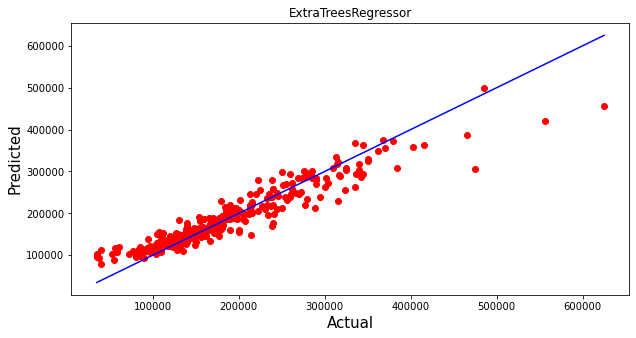

In [119]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='r')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesRegressor")
plt.show()

In [120]:
X_1.shape

(292, 63)

In [121]:
#Predicting Sale price of house using cleaned test dataset X_1
Predicted_Sale_Price=model.predict(X_1)
Predicted_Sale_Price

array([316654.24, 203762.87, 249998.52, 158774.  , 243437.47,  99378.59,
       150833.81, 308480.85, 221867.43, 194323.29, 107480.  , 146684.78,
       127989.3 , 190552.35, 280723.68, 133392.41, 123909.58, 133919.59,
       174767.58, 201992.35, 147205.09, 162087.05, 154957.5 , 125789.35,
       116343.87, 133927.  , 183705.39, 152385.58, 183166.5 , 119274.87,
       137625.23, 209893.83, 225177.17, 157456.  , 120933.3 , 179296.01,
       197520.78, 117300.53, 166198.6 , 157206.56, 117765.24, 306500.85,
       203983.84, 205362.51, 147547.47, 125661.84, 128297.84, 117768.32,
       218317.81, 371397.84, 138578.04, 210615.29, 109717.53, 106511.37,
       255703.25, 142225.59, 138428.57, 184080.22, 139637.31, 253873.09,
       115232.47, 193062.2 , 142768.49, 152400.75, 210099.07, 118137.76,
       165823.63, 207860.57, 149482.25, 154610.26, 269198.91, 174853.45,
       152669.05, 138577.58, 152198.75, 219773.29, 299620.3 , 196696.67,
       284229.86, 150720.5 , 214732.96, 149413.75, 

In [122]:
#Making dataframe for predicted SalePrice
House_Price_Predictions=pd.DataFrame()
House_Price_Predictions["SalePrice"]=Predicted_Sale_Price
House_Price_Predictions.head(10)

,SalePrice
0,316654.24
1,203762.87
2,249998.52
3,158774.00
4,243437.47
5,99378.59
6,150833.81
7,308480.85
8,221867.43
9,194323.29


In [123]:
#Lets save the predictions to csv
House_Price_Predictions.to_csv("House_Price_Predictions.csv",index=False)